We are going to try and build  classifier for ditinguishing between cheetah jaguar and a leopard.

We will not be using the microsoft azure image search API.
We will use what we used previously, to manualy download using javascript

In [1]:
#!pip install fastai --upgrade

In [1]:
root_dir = '/content/'

In [2]:
!pip install fastbook

     |████████████████████████████████| 727kB 7.8MB/s 
     |████████████████████████████████| 51kB 5.4MB/s 
     |████████████████████████████████| 358kB 23.9MB/s 
     |████████████████████████████████| 61kB 6.8MB/s 
     |████████████████████████████████| 1.0MB 16.8MB/s 
     |████████████████████████████████| 40kB 5.2MB/s 
     |████████████████████████████████| 92kB 9.2MB/s 
     |████████████████████████████████| 61kB 6.3MB/s 
     |████████████████████████████████| 51kB 5.8MB/s 
     |████████████████████████████████| 2.6MB 31.2MB/s 
  Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61


In [3]:
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [5]:
from fastbook import *
from fastai.vision.widgets import *

In [8]:
path = Path(root_dir + '/animals')
classes = ['cheetah', 'jaguar', 'leopard']
for folder in classes:
  dest = path/folder
  dest.mkdir(parents=True, exist_ok=True)
  file_name = str(folder) + ".txt"
  print(file_name, path/file_name, dest)
  download_images(url_file=path/file_name, dest=dest ,max_pics=200 )

  # if you get a file not found error then it helps to actually add the variable name

cheetah.txt /content/animals/cheetah.txt /content/animals/cheetah


jaguar.txt /content/animals/jaguar.txt /content/animals/jaguar


leopard.txt /content/animals/leopard.txt /content/animals/leopard


In [ ]:
#!cat {path/file_name}

In [10]:
path.ls()

(#6) [Path('/content/animals/cheetah'),Path('/content/animals/leopard.txt'),Path('/content/animals/jaguar.txt'),Path('/content/animals/cheetah.txt'),Path('/content/animals/leopard'),Path('/content/animals/jaguar')]

In [11]:
fns = get_image_files(path)

In [12]:
fns

(#483) [Path('/content/animals/cheetah/00000058.jpg'),Path('/content/animals/cheetah/00000127.jpg'),Path('/content/animals/cheetah/00000032.jpg'),Path('/content/animals/cheetah/00000158.jpg'),Path('/content/animals/cheetah/00000131.jpg'),Path('/content/animals/cheetah/00000063.jpg'),Path('/content/animals/cheetah/00000038.jpg'),Path('/content/animals/cheetah/00000015.jpg'),Path('/content/animals/cheetah/00000132.jpg'),Path('/content/animals/cheetah/00000137.jpg')...]

In [13]:
failed = verify_images(fns)

In [14]:
# to remove all failed images
failed.map(Path.unlink)

(#0) []

In [15]:
??get_image_files

# for getting help

In [16]:
animals = DataBlock(
    blocks = (ImageBlock, CategoryBlock), # independent and dependent blocks
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.2,seed=42),
    get_y = parent_label,
    # parent_label is a function provided by fastai 
    # that simply gets the name of the folder a file is in.
    item_tfms = Resize(128)
)

In [17]:
dls =animals.dataloaders(path)
# DataLoader is a class that provides batches of a few items at a time to the GPU.


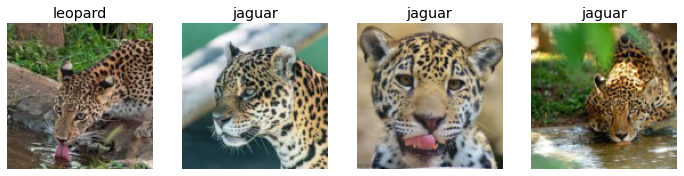

In [18]:
dls.valid.show_batch(max_n=4, nrows=1)

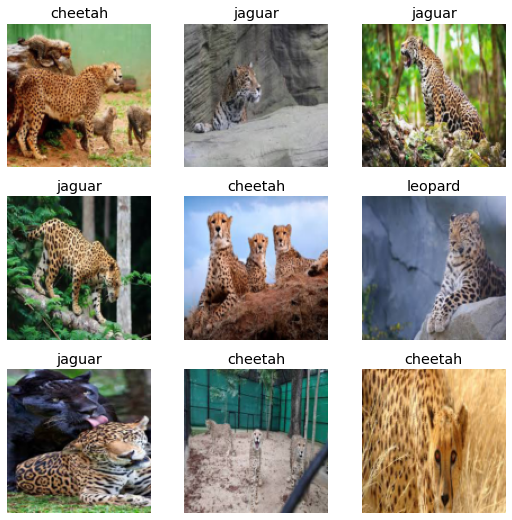

In [19]:
animals = animals.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = animals.dataloaders(path)
dls.show_batch()

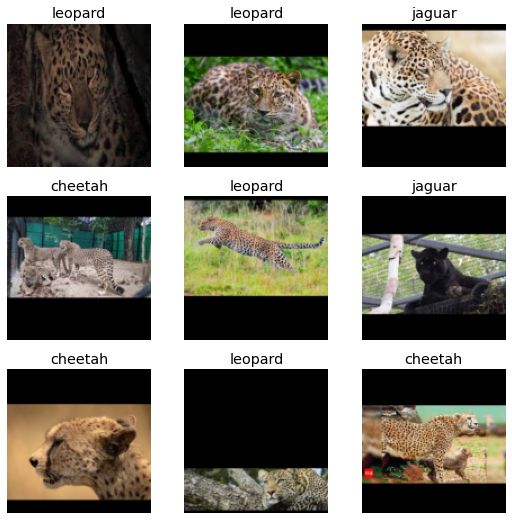

In [20]:
animals = animals.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = animals.dataloaders(path)
dls.show_batch()

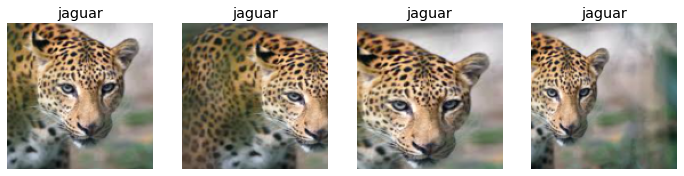

In [21]:
animals = animals.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = animals.dataloaders(path)
dls.show_batch(max_n=4, nrows=1, unique=True)

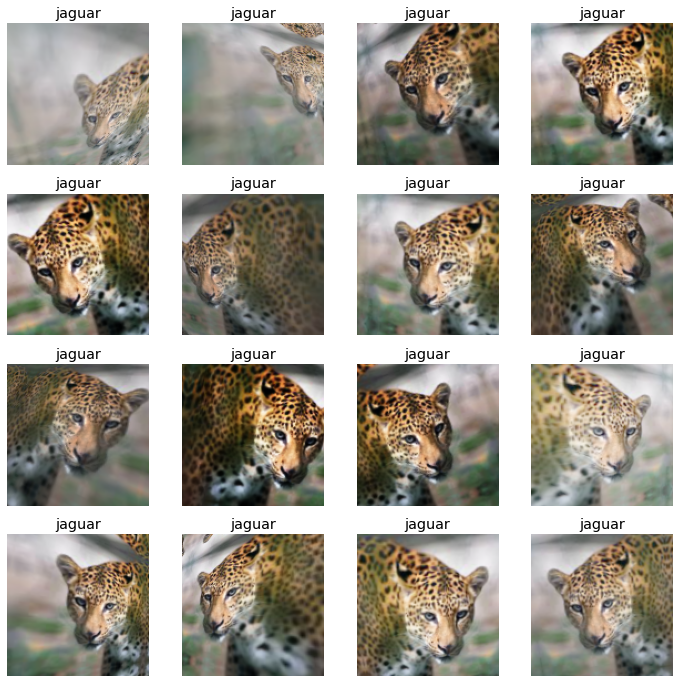

In [22]:
animals = animals.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = animals.dataloaders(path)
dls.show_batch(max_n=16, nrows=4, unique=True)

In [23]:
animals = animals.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = animals.dataloaders(path)

In [24]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.693298,1.145331,0.416667,01:12


epoch,train_loss,valid_loss,error_rate,time
0,0.919364,0.920059,0.302083,01:40
1,0.837553,0.773315,0.281250,01:38
2,0.717935,0.705191,0.260417,01:38
3,0.653635,0.649896,0.218750,01:38


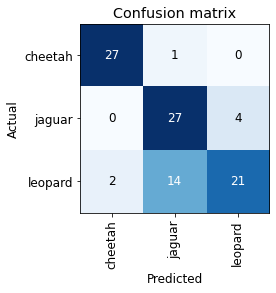

In [25]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

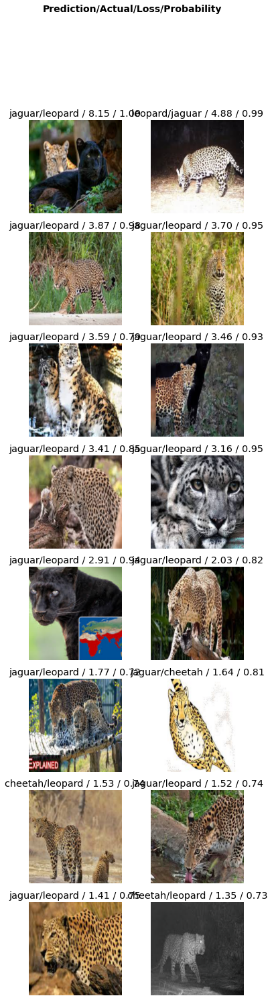

In [28]:
interp.plot_top_losses(16, nrows=8)

In [30]:
interp.vocab

(#3) ['cheetah','jaguar','leopard']

In [32]:
cleaner = ImageClassifierCleaner(learn)
cleaner

# Creating a model for web

In [33]:
learn.export()

In [34]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [51]:
learn_inf = load_learner(path/'export.pkl')


In [52]:
learn_inf.predict('/content/animals/cheetah/00000000.jpg')

('cheetah', tensor(0), tensor([9.9792e-01, 6.3384e-07, 2.0831e-03]))

In [53]:
learn_inf.dls.vocab

(#3) ['cheetah','jaguar','leopard']

In [54]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [57]:
img =   PILImage.create(btn_upload.data[-1])

In [58]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [59]:
pred, pred_idx, probs = learn_inf.predict(img)

In [60]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: leopard; Probability: 0.6957')

In [62]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

Label(value='Prediction: leopard; Probability: 0.6957')


In [64]:
def on_click_classify(change):
  img = PILImage.create(btn_upload.data[-1])
  out_pl.clear_output()
  with out_pl: display(img.to_thumb(128,128))
  pred, pred_idx, probs = learn_inf.predict(img)
  lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
  #print(lbl_pred)

btn_run.on_click(on_click_classify)

In [65]:
btn_upload =widgets.FileUpload()

In [66]:
VBox([widgets.Label('Select your animal!'), 
       btn_upload, btn_run, out_pl, lbl_pred])

Label(value='Prediction: jaguar; Probability: 0.9994')


# Executing on a real app

In [68]:
!pip install viola


Enabling: viola
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension viola
      X is viola importable?


In [70]:
import viola

!jupyter serverextension enable viola --sys-prefix

Enabling: viola
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension viola
      X is viola importable?
